Cardiotocography (CTG) is used during pregnancy to monitor fetal heart rate and uterine contractions. It is monitor fetal well-being and allows early detection of fetal distress. 

CTG interpretation helps in determining if the pregnancy is high or low risk.  An abnormal CTG may indicate the need for further investigations and potential intervention.

In this project, I will create a model to classify the outcome of Cardiotocogram test to ensure the well being of the fetus. 
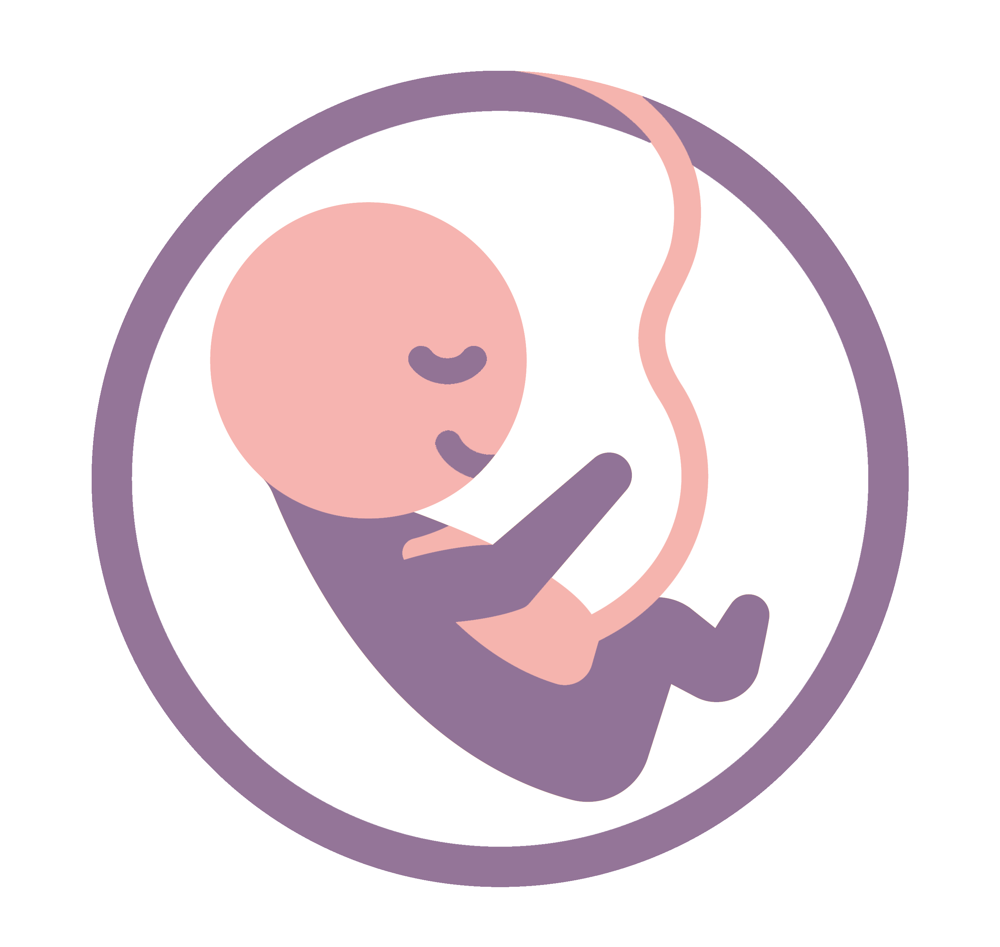

 # TABLE OF CONTENTS

**IMPORTING LIBRARIES**

**LOADING DATA**

**DATA PREPROCESSING**

**DATA ANALYSIS**

**MODEL BUILDING**

**CONCLUSIONS**

# IMPORTING LIBRARIES

In [51]:
# removing warnings
import warnings
warnings.filterwarnings("ignore")

# Importing Libraries
# ============== generals ==============
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# ============== Preprocesing ==============
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# ============== ML Models ==============
from sklearn.linear_model import LogisticRegression, SGDClassifier, Perceptron
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    ExtraTreesClassifier,
    VotingClassifier,
    StackingClassifier
)

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier

# ============== Metrics and Searchers ==============

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, roc_auc_score
np.random.seed(0)

# Loading Data

In [3]:
data = pd.read_csv("../input/fetal-health-classification/fetal_health.csv")
data.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,133.303857,9.840844,106.0,126.000,133.000,140.000,160.000
accelerations,2126.0,0.003178,0.003866,0.0,0.000,0.002,0.006,0.019
fetal_movement,2126.0,0.009481,0.046666,0.0,0.000,0.000,0.003,0.481
uterine_contractions,2126.0,0.004366,0.002946,0.0,0.002,0.004,0.007,0.015
light_decelerations,2126.0,0.001889,0.002960,0.0,0.000,0.000,0.003,0.015
severe_decelerations,2126.0,0.000003,0.000057,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,2126.0,0.000159,0.000590,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,2126.0,46.990122,17.192814,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,2126.0,1.332785,0.883241,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,2126.0,9.846660,18.396880,0.0,0.000,0.000,11.000,91.000


**On This Dataset**
**Cardiotocograms (CTGs)** are a simple and cost accessible option to assess fetal health, allowing healthcare professionals to take action in order to prevent child and maternal mortality. The equipment itself works by sending ultrasound pulses and reading its response, thus shedding light on fetal heart rate (FHR), fetal movements, uterine contractions and more.

This dataset contains 2126 records of features extracted from Cardiotocogram exams, which were then classified by expert obstetrician into 3 classes:

1. Normal
1. Suspect
1. Pathological

**Features:**

* **'baseline value'** FHR baseline (beats per minute)
* **'accelerations'** Number of accelerations per second
* **'fetal_movement'** Number of fetal movements per second
* **'uterine_contractions'** Number of uterine contractions per second
* **'light_decelerations'** Number of light decelerations per second
* **'severe_decelerations'** Number of severe decelerations per second
* **'prolongued_decelerations'** Number of prolonged decelerations per second
* **'abnormal_short_term_variability'** Percentage of time with abnormal short term variability
* **'mean_value_of_short_term_variability'** Mean value of short term variability
* **'percentage_of_time_with_abnormal_long_term_variability'** Percentage of time with abnormal long term variability
* **'mean_value_of_long_term_variability'** Mean value of long term variability 
* **'histogram_width'** Width of FHR histogram
* **'histogram_min' Minimum** (low frequency) of FHR histogram
* **'histogram_max' Maximum** (high frequency) of FHR histogram
* **'histogram_number_of_peaks'** Number of histogram peaks
* **'histogram_number_of_zeroes'** Number of histogram zeros
* **'histogram_mode'** Histogram mode
* **'histogram_mean'** Histogram mean
* **'histogram_median'** Histogram median
* **'histogram_variance'** Histogram variance
* **'histogram_tendency'** Histogram tendency

* **Target:**
* **'fetal_health'** Tagged as 1 (Normal), 2 (Suspect) and 3 (Pathological)

# Data Analysis

**The analysis consist of:**
* Count Plot
* Corelation Heat Map
* Implot
* Swarm And Boxen Plot


In [6]:
target_col = 'fetal_health'
numerical_features = [feat for feat in data.columns if feat not in target_col] # all the features are numerical

In [7]:
len(numerical_features)

21

In [8]:
# calculating skewness and kurtosis 

results = []

for col in numerical_features:
    skew_val = data[col].skew()
    kurt_val = data[col].kurt()
    results.append({
        'features': col,
        'skew': skew_val,
        'kurtosis': kurt_val
    })

skew_kurt_df = pd.DataFrame(results)


In [9]:
skew_kurt_df

,features,skew,kurtosis
0,baseline value,0.020312,-0.292943
1,accelerations,1.204392,0.767648
2,fetal_movement,7.811477,64.260821
3,uterine_contractions,0.159315,-0.635071
4,light_decelerations,1.718437,2.517461
5,severe_decelerations,17.353457,299.424142
6,prolongued_decelerations,4.323965,20.515918
7,abnormal_short_term_variability,-0.011829,-1.051030
8,mean_value_of_short_term_variability,1.657339,4.700756
9,percentage_of_time_with_abnormal_long_term_var...,2.195075,4.252998


In [10]:
# for row in skew_kurt_df.itertuples():
#     if abs(row.skew) > 2:
#         print(f"{row.features} --> Highly skewed")
#     elif abs(row.skew) > 1:
#         print(f"{row.features} --> Moderately skewed")
#     elif abs(row.skew) > 0.5:
#         print(f"{row.features} --> Slightly skewed")
#     else:
#         print(f"{row.features} --> Normal")


def classify_skewness(row):
    if abs(row) > 2:
        return 'High'
    if abs(row) > 1:
        return 'Moderate'
    if abs(row) > 0.5:
        return 'Slight'
    return 'Normal'

skew_kurt_df['skewness'] = skew_kurt_df['skew'].apply(classify_skewness)

In [11]:
skew_kurt_df[(skew_kurt_df['skewness'] == 'High') | (skew_kurt_df['skewness'] == 'Moderate')]

,features,skew,kurtosis,skewness
1,accelerations,1.204392,0.767648,Moderate
2,fetal_movement,7.811477,64.260821,High
4,light_decelerations,1.718437,2.517461,Moderate
5,severe_decelerations,17.353457,299.424142,High
6,prolongued_decelerations,4.323965,20.515918,High
8,mean_value_of_short_term_variability,1.657339,4.700756,Moderate
9,percentage_of_time_with_abnormal_long_term_var...,2.195075,4.252998,High
10,mean_value_of_long_term_variability,1.331998,4.131254,Moderate
15,histogram_number_of_zeroes,3.920287,30.365084,High
19,histogram_variance,3.219974,15.131589,High


These features are High to Moderately skewed. Transformations might be needed

# Distributions of the Numerical Features

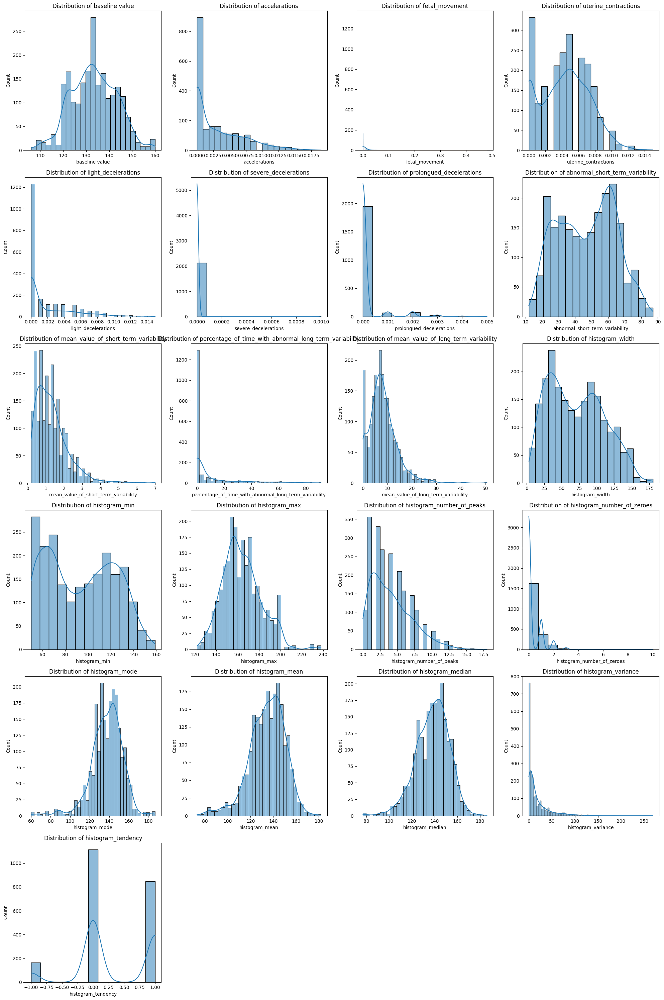

In [12]:
plots_per_row = 4

num_rows = math.ceil(len(numerical_features) / plots_per_row)

fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5 * num_rows))

axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    sns.histplot(data=data[feature], ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {feature}')

for j in range(len(numerical_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Apart from **baseline value**, **uterine_contractions**, **abnormal_short_time_variability**, **histogram_width**, **histogram_min**, **histogram_median**, **histogram_tendency** all the other numerical features are more or less skewed.

**light_decelerations** , **fetal_movement**, **prolongued_decelerations**, **histogram_number_of_zeroes**, **histogram_variance** are highly skewed.

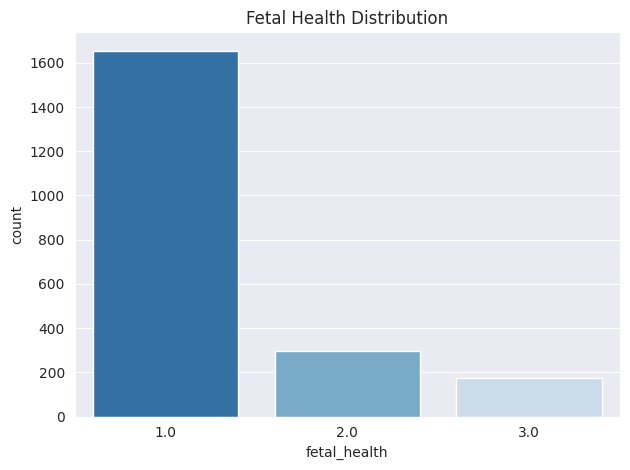

In [13]:
# plt.figure(figsize=(8, 5))
# order = data['fetal_health'].value_counts().index
with sns.axes_style("darkgrid"):
    ax = sns.countplot(data=data,
                    x='fetal_health',
                    # order=order,
                    # hue='fetal_health',
                    # hue_order=order,
                    palette='Blues_r',
                    )

plt.title(f"Fetal Health Distribution")
plt.tight_layout()
plt.show()

The count plot of targets indicates an **imbalance** in data. This is a case that tends to provide misleading classification accuracy. 


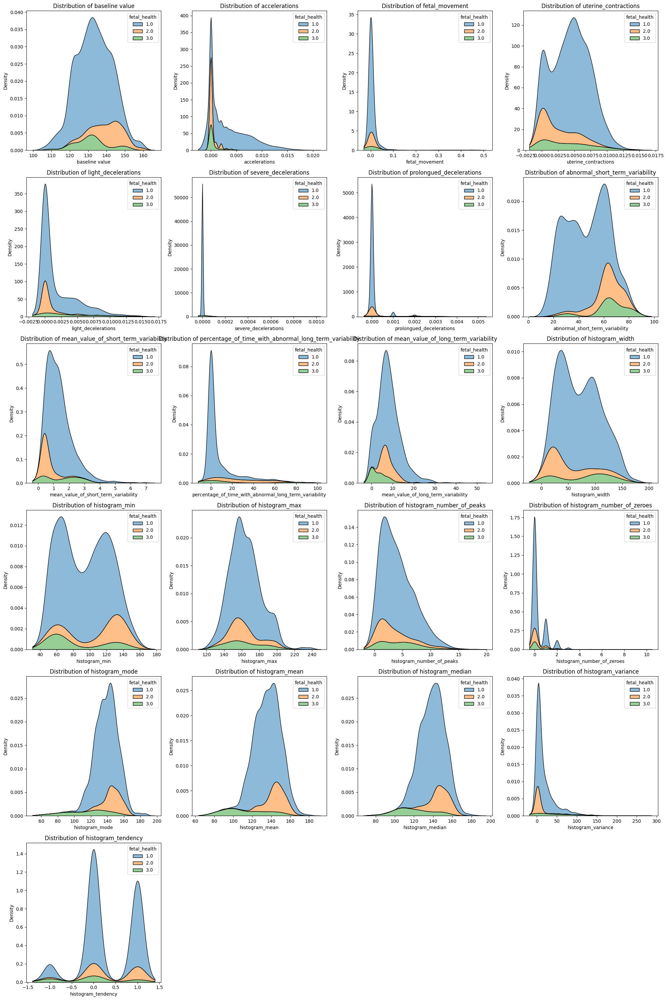

In [14]:
plots_per_row = 4

num_rows = math.ceil(len(numerical_features) / plots_per_row)

fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5 * num_rows))

axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    sns.kdeplot(data=data,
                ax=axes[i],
                x=feature,
                hue='fetal_health',
                # fill=True,
                palette='tab10',
                alpha=.5,
                multiple='stack'
                )
    axes[i].set_title(f'Distribution of {feature}')

for j in range(len(numerical_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


With most of the data are of the "Normal" or 1, the distribution of the other two targets are not normal in most of the cases. And there are not many data from these two classes. Class 1 is kind of normally distributed in most of the cases.

# Boxplot of the features

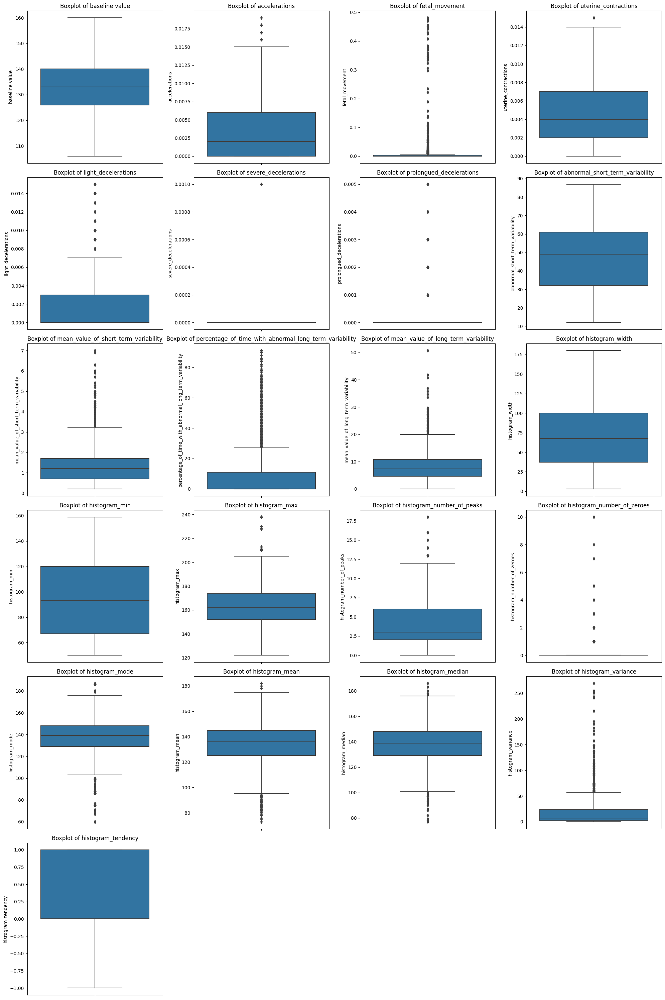

In [15]:
plots_per_row = 4

num_rows = math.ceil(len(numerical_features) / plots_per_row)

fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5 * num_rows))

axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    sns.boxplot(data=data,
                ax=axes[i],
                y=feature,
                # hue='fetal_health',
                # fill=True,
                # palette='tab10',
                # alpha=.5,
                # multiple='stack'
                )
    axes[i].set_title(f'Boxplot of {feature}')

for j in range(len(numerical_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


**Outliers** or extreme values are abundant in most of the features. We'll either need to remove them or replace them with sutiable values.

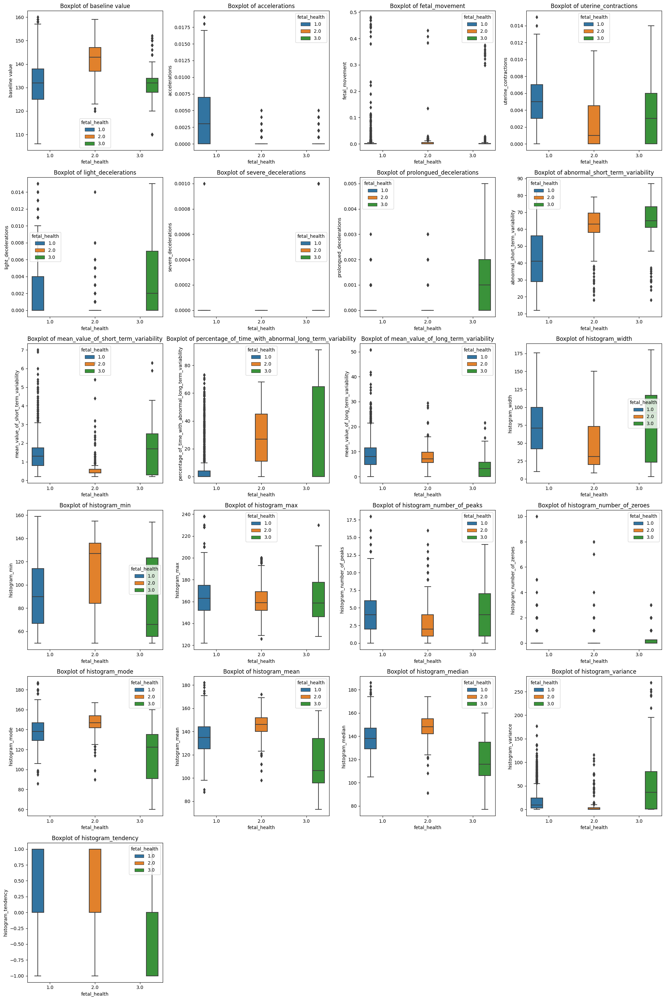

In [16]:
plots_per_row = 4

num_rows = math.ceil(len(numerical_features) / plots_per_row)

fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5 * num_rows))

axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    sns.boxplot(data=data,
                ax=axes[i],
                x='fetal_health',
                y=feature,
                hue='fetal_health',
                # fill=True,
                palette='tab10',
                # alpha=.5,
                # multiple='stack'
                )
    axes[i].set_title(f'Boxplot of {feature}')

for j in range(len(numerical_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


1. There might be some non-linear relationship between **fetal_health** vs **(baseline_value, uterine_contractions, mean_value_of_short_term_variability, histogram_width, histogram_min, histogram_variance)**
2. Linear relationship between **fetal_health** vs **(accelarations, prolongued_decelerations, abnormal_short_term_variablity, percentage_of_time_with_abnormal_short_term_variablity, mean_value_of_long_term_variability, histogram_tendency)**

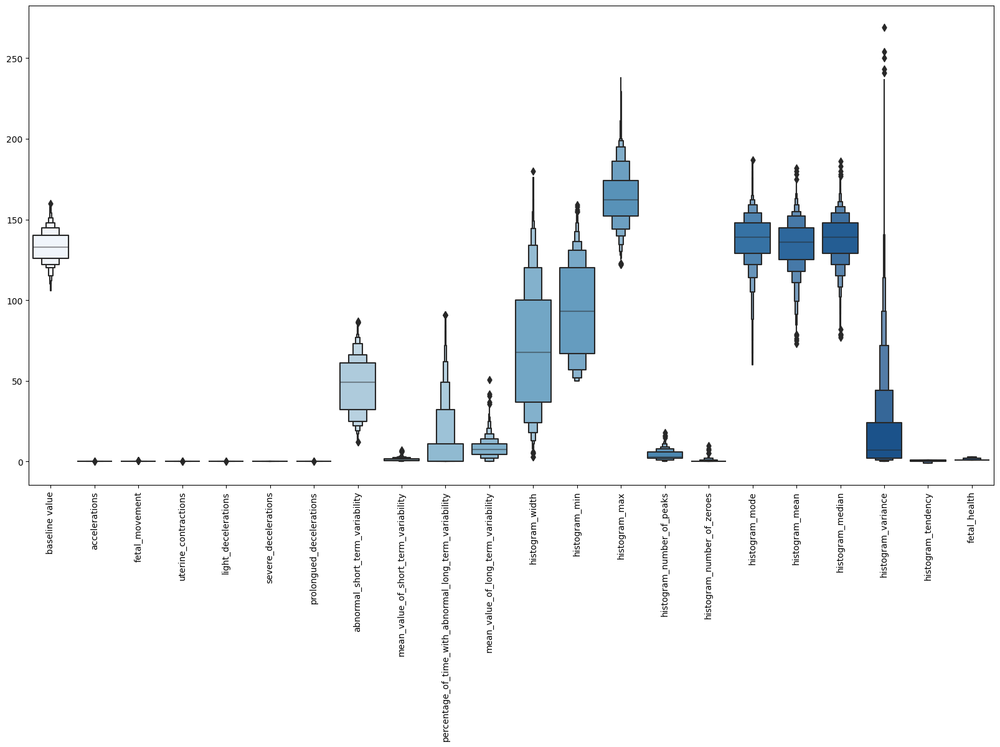

In [17]:
plt.figure(figsize=(20,10))
sns.boxenplot(data, palette='Blues')
plt.xticks(rotation=90)
plt.show()

From the boxenplot we can see that the features are scaled differently. So, when we are developing ML model we'll need scale them to the same scale.

# Correlations Analysis

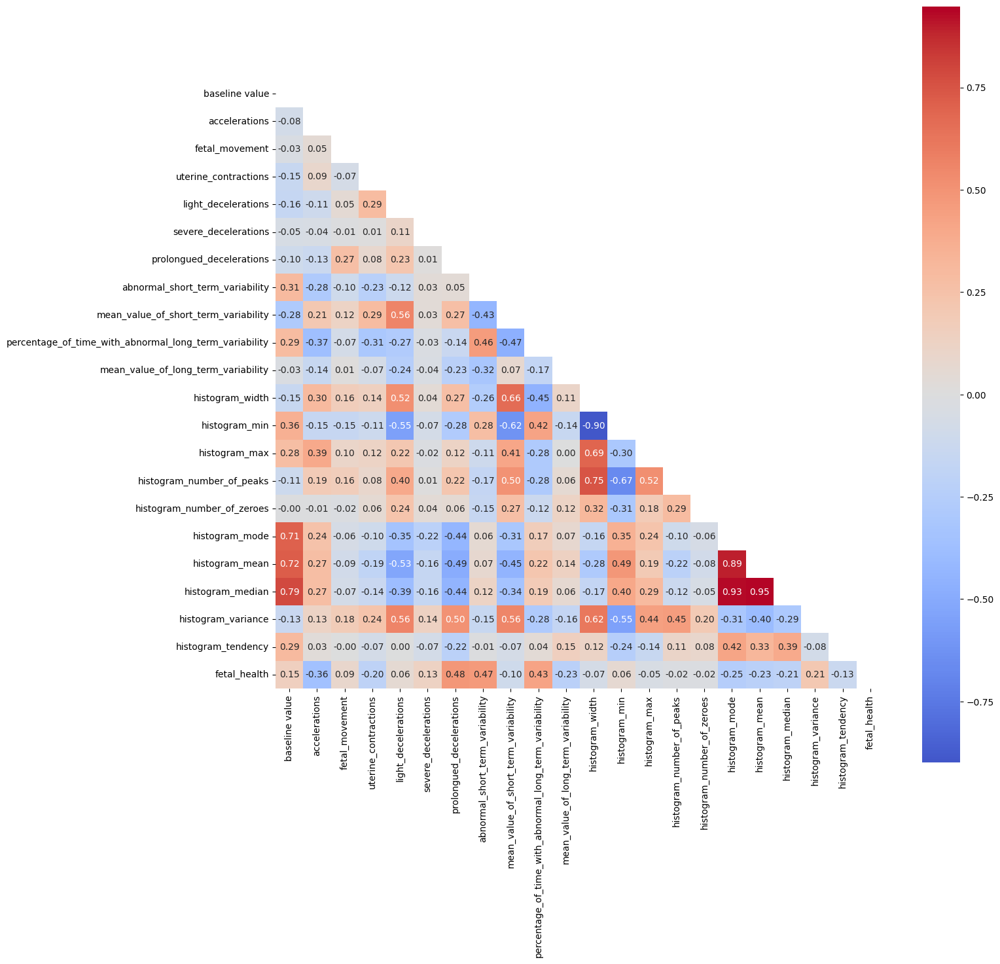

In [18]:
corr =  data.corr()

# Create a mask
mask = np.triu(np.ones_like(corr, dtype=bool))

# Create a custom divergin palette
# cmap = sns.diverging_palette(100, 7, s=75, l=40,
#                             n=5, center="light", as_cmap=True)

plt.figure(figsize=(15, 15))
sns.heatmap(corr, mask=mask, center=0, annot=True,
            fmt='.2f', square=True, cmap='coolwarm')

plt.show()

Based on the correlation matrix, it is clear that "**accelerations**", "**prolongued_decelerations**", "**abnormal_short_term_variability**", "**percentage_of_time_with_abnormal_long_term_variability**" and "**mean_value_of_long_term_variability**" are the features with higher correlation with fetal_health.

Also, Multicolinearity exists with other features. Which might impose problems predicting target classes

<Figure size 1500x1200 with 0 Axes>

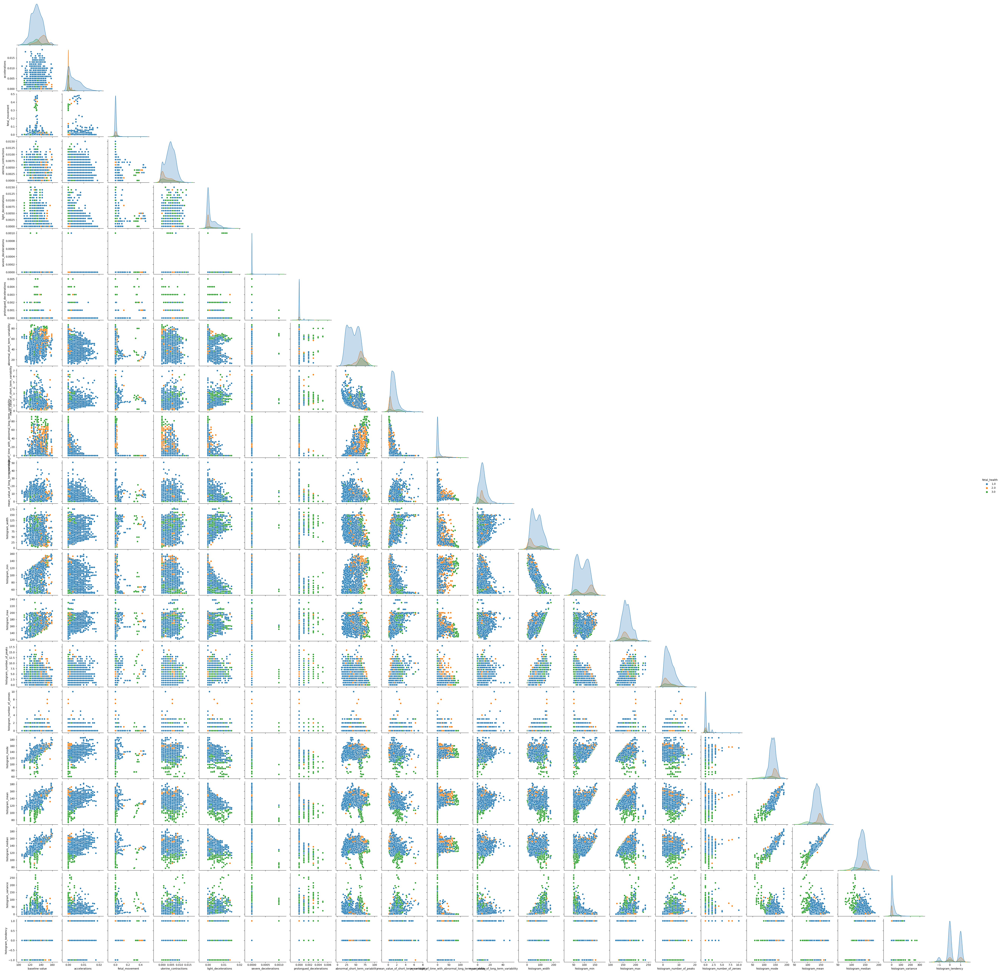

In [19]:
plt.figure(figsize=(15, 12))
sns.pairplot(data=data, corner=True, hue='fetal_health', palette='tab10')
plt.show()

**Accelerations Vs Fetal Movement by Fetal Health**

<Figure size 1200x500 with 0 Axes>

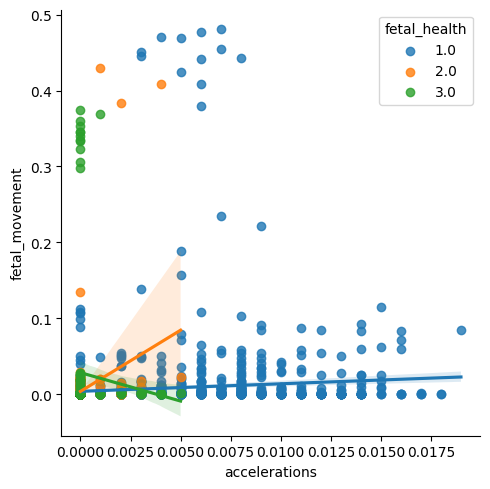

In [24]:
sns.lmplot(data=data,
           x="accelerations",
           y="fetal_movement",
           palette='tab10', 
           hue="fetal_health",
           legend_out=False)
plt.show()

**Prolongued Decelerations Vs Fetal Movement by Fetal Health**

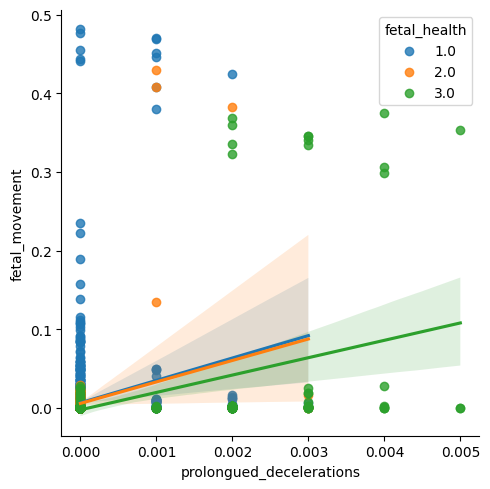

In [26]:
sns.lmplot(data=data,
           x="prolongued_decelerations",
           y="fetal_movement",
           palette='tab10',
           hue="fetal_health",
           legend_out=False)
plt.show()

**Abnormal Short Term Variability Vs Fetal Movement by Fetal Health**

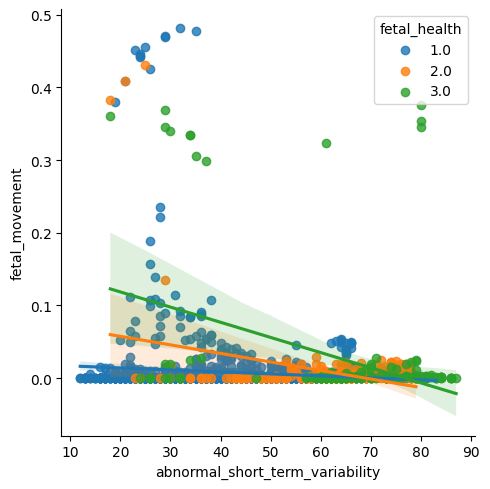

In [27]:
sns.lmplot(data=data,
           x="abnormal_short_term_variability",
           y="fetal_movement",
           palette='tab10',
           hue="fetal_health",
           legend_out=False)
plt.show()

**Mean Value Of Long Term Variability Vs Fetal Movement by Fetal Health**

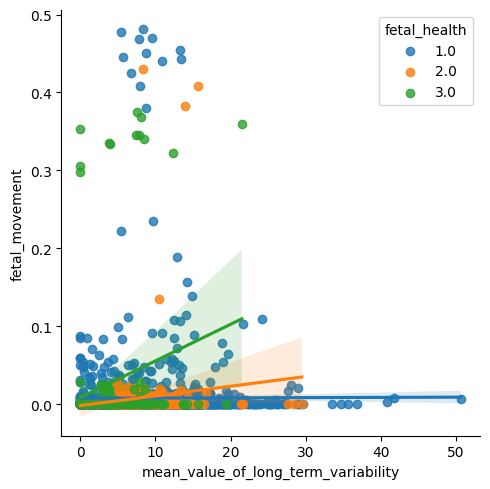

In [28]:
sns.lmplot(data=data, 
           x="mean_value_of_long_term_variability",
           y="fetal_movement",
           palette='tab10',
           hue="fetal_health",
           legend_out=False)
plt.show()

We can see the rates of change of the above-mentioned values with each target show a specific trend. 
We can also spot outliers.

In [34]:
from scipy.stats import f_oneway

anova_results = []
target = 'fetal_health'
# Loop through each numerical feature
for col in numerical_features:
    # Group feature values by target categories
    groups = [data[col][data[target] == category] for category in data[target].unique()]
    
    # Perform ANOVA test
    f_stat, p_value = f_oneway(*groups)
    
    # Append results
    anova_results.append({'Feature': col, 'F-Statistic': f_stat, 'P-Value': p_value})

# Convert results to a DataFrame for better readability
anova_df = pd.DataFrame(anova_results)

# Sort by P-Value in ascending order
anova_df = anova_df.sort_values(by='P-Value')

In [35]:
anova_df.loc[anova_df['P-Value'] < 0.05]

,Feature,F-Statistic,P-Value
6,prolongued_decelerations,505.853206,2.210238e-180
9,percentage_of_time_with_abnormal_long_term_var...,345.156385,1.631148e-130
7,abnormal_short_term_variability,343.820419,4.472368e-130
17,histogram_mean,297.625497,1.145660e-114
16,histogram_mode,275.117696,5.720429e-107
18,histogram_median,248.772237,8.606065e-98
1,accelerations,196.027523,7.520612e-79
19,histogram_variance,150.796849,5.796289e-62
0,baseline value,140.621076,4.457098e-58
8,mean_value_of_short_term_variability,119.882006,4.695912e-50


* **Highly Influential Features**: **prolongued_decelerations**, **abnormal_variability**, and **histogram_mean** have the highest F-statistics and extremely low p-values, indicating a **strong relationship** with the target variable.

* **Dominance of Histogram Features**: Histogram-based features (mean, mode, median, variance) consistently rank high in significance, highlighting their importance in capturing data distribution and variability.

* **Significance of Physiological Signals**: Features like **accelerations**, **baseline value**, and **short-term variability** metrics significantly influence the target, emphasizing their relevance in the analysis.

* **Lower Impact Features**: **fetal_movement** and **histogram_number_of_peaks** show less influence but remain statistically significant, offering potential secondary insights.

* **Actionable Insights**: Prioritize features with **p-values < 1e-50**, such as **prolongued_decelerations** and **histogram_mean**, for feature selection to improve model performance and reduce noise.

The above plot shows the range of our feature attributes. All the features are in different ranges. To fit this in a model we must scale it to the same range.

In the model building, we will preprocess the features to do the same.

# Model Selection and Development
In this section we will:
* Set up features(X) and target(Y)
* Scale the features
* Split training and test sets 
* Model selection
* Hyperparameter tuning

In [42]:
#assigning values to features as X and target as y
X = data.drop(["fetal_health"],axis=1)
y = data["fetal_health"]

#Set up a standard scaler for the features
col_names = list(X.columns)
s_scaler = preprocessing.StandardScaler()
X_df = s_scaler.fit_transform(X)
X_df = pd.DataFrame(X_df, columns=col_names)   

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,1.042753e-15,1.000235,-2.775197,-0.742373,-0.030884,0.680604,2.713428
accelerations,2126.0,6.684315e-17,1.000235,-0.822388,-0.822388,-0.304881,0.730133,4.093929
fetal_movement,2126.0,1.336863e-17,1.000235,-0.203210,-0.203210,-0.203210,-0.138908,10.106540
uterine_contractions,2126.0,-1.336863e-16,1.000235,-1.482465,-0.803434,-0.124404,0.894142,3.610264
light_decelerations,2126.0,-5.347452e-17,1.000235,-0.638438,-0.638438,-0.638438,0.375243,4.429965
severe_decelerations,2126.0,0.000000e+00,1.000235,-0.057476,-0.057476,-0.057476,-0.057476,17.398686
prolongued_decelerations,2126.0,0.000000e+00,1.000235,-0.268754,-0.268754,-0.268754,-0.268754,8.208570
abnormal_short_term_variability,2126.0,-1.136334e-16,1.000235,-2.035639,-0.872088,0.116930,0.815060,2.327675
mean_value_of_short_term_variability,2126.0,5.347452e-17,1.000235,-1.282833,-0.716603,-0.150373,0.415857,6.417893
percentage_of_time_with_abnormal_long_term_variability,2126.0,0.000000e+00,1.000235,-0.535361,-0.535361,-0.535361,0.062707,4.412293


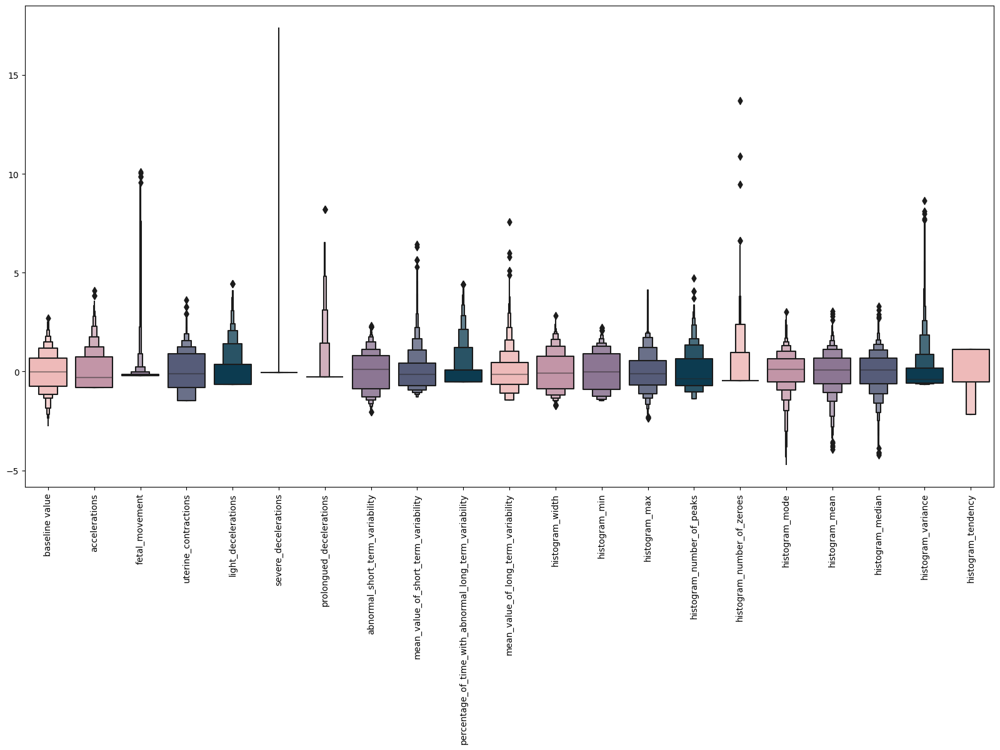

In [43]:
#looking at the scaled features
plt.figure(figsize=(20,10))
sns.boxenplot(data = X_df,palette = shades)
plt.xticks(rotation=90)
plt.show()

All the features are around the same scale, after Scaling

In [45]:
#spliting test and training sets
X_train, X_test, y_train,y_test = train_test_split(X_df,y,test_size=0.2,random_state=42)

In [46]:
print(f"Train shape: {X_train.shape}")
print(f"Test shape: {X_test.shape}")

Train shape: (1700, 21)
Test shape: (426, 21)


In [55]:
#A quick model selection process
#pipelines of models( it is short was to fit and pred)
pipeline_lr = Pipeline([('lr_classifier',LogisticRegression())])

pipeline_dt = Pipeline([('dt_classifier',DecisionTreeClassifier())])

pipeline_gbcl = Pipeline([('gbcl_classifier',GradientBoostingClassifier())])

pipeline_rf = Pipeline([('rf_classifier',RandomForestClassifier())])

pipeline_knn = Pipeline([('knn_classifier',KNeighborsClassifier())])

pipeline_svc=Pipeline([('sv_classifier',SVC())])

# List of all the pipelines
pipelines = [pipeline_lr, pipeline_dt, pipeline_gbcl, pipeline_rf, pipeline_knn, pipeline_svc]

# Dictionary of pipelines and classifier types for ease of reference
pipe_dict = {0: 'Logistic Regression',
             1: 'Decision Tree',
             2: 'GradientBoost',
             3: "RandomForest",
             4: "KNN",
             5: "SVC"
            }


# Fit the pipelines
for pipe in pipelines:
    pipe.fit(X_train, y_train)

#cross validation on accuracy 
cv_results_accuracy = []
print("Cross Validation Starts 10 Folds")
for i, model in enumerate(pipelines):
    cv_score = cross_val_score(model, X_train,y_train, cv=10 )
    cv_results_accuracy.append(cv_score)
    print(f"{pipe_dict[i]} CV score: {cv_score.mean():.3f}")

Cross Validation Starts 10 Folds
Logistic Regression CV score: 0.896
Decision Tree CV score: 0.908
GradientBoost CV score: 0.944
RandomForest CV score: 0.938
KNN CV score: 0.900
SVC CV score: 0.912


So Random Forest does best amongst the models to be the most accurate. Let us build a better random forest with grid search cv.
Let's find out how it performs on testset

In [56]:
#taking look at the test set
pred_rfc = pipeline_rf.predict(X_test)
accuracy = accuracy_score(y_test, pred_rfc)
print(accuracy)

0.9483568075117371


In [57]:
#Building a dictionalry with list of optional values that will me analyesed by GridSearch CV
parameters = { 
    'n_estimators': [100,150, 200,500,700,900],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,6,8,12,14,16],
    'criterion' :['gini', 'entropy'],
    'n_jobs':[-1,1,None]
}

#Fitting the trainingset to find parameters with best accuracy

CV_rfc = GridSearchCV(estimator=RandomForestClassifier(), param_grid=parameters, cv= 5)
CV_rfc.fit(X_train, y_train)

#Getting the outcome of gridsearch

CV_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 14,
 'max_features': 'sqrt',
 'n_estimators': 150,
 'n_jobs': 1}

In [58]:
RF_model = RandomForestClassifier(**CV_rfc.best_params_)
RF_model.fit(X_train, y_train)
#Testing the Model on test set
predictions=RF_model.predict(X_test)
acccuracy= accuracy_score(y_test,predictions)
acccuracy

0.9553990610328639

In [59]:
acccuracy = accuracy_score(y_test, predictions)
recall = recall_score(y_test, predictions, average="weighted")
precision = precision_score(y_test, predictions, average="weighted")
f1_score = f1_score(y_test, predictions, average="micro")

print("********* Random Forest Results *********")
print("Accuracy    : ", acccuracy)
print("Recall      : ", recall)
print("Precision   : ", precision)
print("F1 Score    : ", f1_score)

********* Random Forest Results *********
Accuracy    :  0.9553990610328639
Recall      :  0.9553990610328639
Precision   :  0.9548015974511286
F1 Score    :  0.9553990610328639


In [60]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

         1.0       0.97      0.98      0.97       333
         2.0       0.91      0.83      0.87        64
         3.0       0.90      0.93      0.92        29

    accuracy                           0.96       426
   macro avg       0.93      0.91      0.92       426
weighted avg       0.95      0.96      0.95       426



<Axes: >

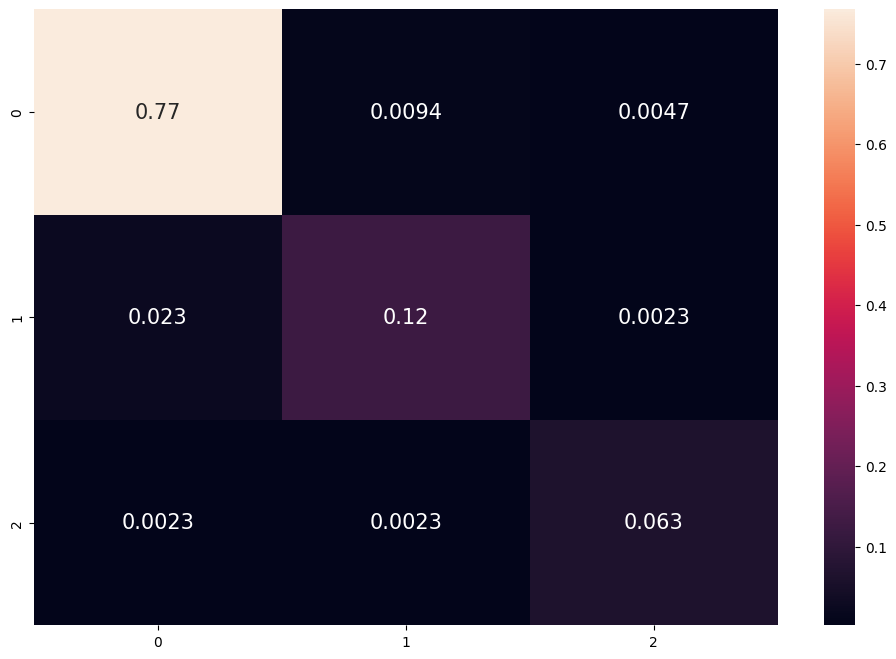

In [62]:
# cofusion matrix
plt.subplots(figsize=(12,8))
cf_matrix = confusion_matrix(y_test, predictions)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot = True, annot_kws = {'size':15})

**<span style="color:#003f5c;"> If you liked this Notebook, please do upvote.</span>**

**<span style="color:#003f5c;"> If you have any suggestions or questions, I am all ears!</span>**

**<span style="color:#003f5c;">Best Wishes!</span>**

<a id="5"></a> 
# <h1 style='background:#f7b2b0; border:0; color:black'><center>END</center></h1> 